# Setup

In [1]:
!nvidia-smi
%pip install ultralytics
import ultralytics
ultralytics.checks()
import os
HOME = os.getcwd()
print("HOME:", HOME)
%pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
%pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
!mkdir -p {HOME}/weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {HOME}/weights
CHECKPOINT_PATH = os.path.join(HOME, "weights", "sam_vit_h_4b8939.pth")
print(CHECKPOINT_PATH, "; exist:", os.path.isfile(CHECKPOINT_PATH))
import torch
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
MODEL_TYPE = "vit_h"

Ultralytics YOLOv8.2.42 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.2/78.2 GB disk)
HOME: /content
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.2/49.2 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.4 MB/s eta 0:00:00
/content/weights/sam_vit_h_4b8939.pth ; exist: True


# Imports

In [2]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
from ultralytics import YOLO
import numpy as np

#YOLOv8 bounding box extraction

In [3]:
IMAGE_PATH ='/content/cup.jpeg'
desired_label=["remote","bottle","cup","bowl","vase","scissors","toothbrush","wine glass","baseball bat"]

In [4]:
def process_image(IMAGE_PATH,desired_label):
  model = YOLO("yolov8n.pt")
  results = model([IMAGE_PATH])
  for result in results:
    boxes = result.boxes
    for i in range(boxes.shape[0]):
      if (model.names[int(boxes.cls[i].item())] in desired_label):
        bounding_box=np.array([(boxes.xyxy[i].cpu().numpy()[0]),
                      (boxes.xyxy[i].cpu().numpy()[1]),
                      (boxes.xyxy[i].cpu().numpy()[2]),
                      (boxes.xyxy[i].cpu().numpy()[3])])

        return bounding_box


In [5]:
bbox=process_image(IMAGE_PATH,desired_label)

100%|██████████| 6.23M/6.23M [00:00<00:00, 127MB/s]



0: 640x640 1 cup, 1 dining table, 16.1ms
Speed: 36.5ms preprocess, 16.1ms inference, 807.7ms postprocess per image at shape (1, 3, 640, 640)


In [6]:
bbox

array([     301.12,      540.75,      832.93,      908.71], dtype=float32)

#SAM segmentation

In [7]:
sam = sam_model_registry[MODEL_TYPE](checkpoint=CHECKPOINT_PATH).to(device=DEVICE)

In [8]:
mask_generator = SamAutomaticMaskGenerator(sam)

In [9]:
mask_predictor = SamPredictor(sam)

In [10]:
import cv2
import numpy as np
import supervision as sv

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

In [11]:
import cv2
import numpy as np
import supervision as sv

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

mask_predictor.set_image(image_rgb)

masks, scores, logits = mask_predictor.predict(
    box=bbox,
    multimask_output=False
)

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


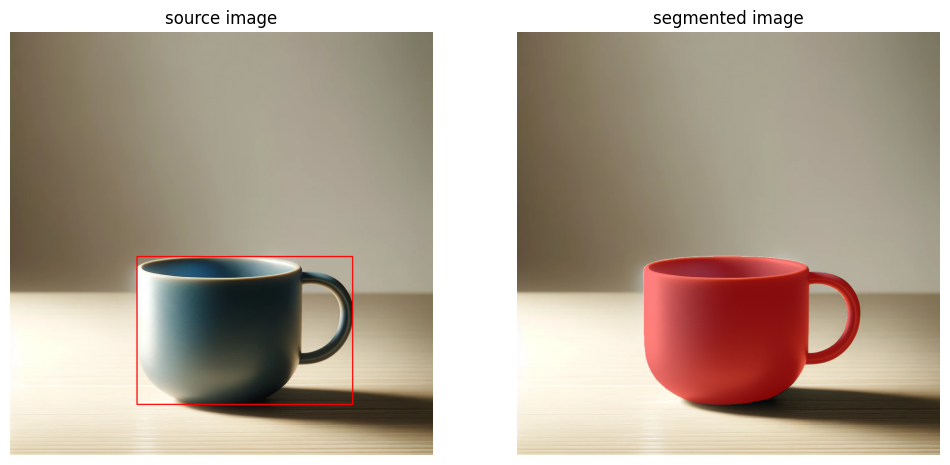

In [12]:
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

In [13]:
import cv2 as cv
import random
from math import atan2, cos, sin, sqrt, pi , tan , radians
from shapely.geometry import LineString,Polygon
from google.colab.patches import cv2_imshow
from itertools import combinations
def calculate_angle_and_coordinates(ann,image,bbox):
      bw=ann.mask[0].astype(int)
      bw = np.array(bw, np.uint8)
      contours, _ = cv.findContours(bw, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
      cv2.drawContours(image, contours, -1, (0, 255, 0), 3)
      points=[]
      x=random.randint(int(bbox[0]),int(bbox[2]))
      y=random.randint(int(bbox[1]),int(bbox[3]))
      x_limit=list(range(x-1024, x+1024))
      x_limit=np.array(x_limit)
      y_limit=[]
      for k in range(-1024,1024):
            y_limit.append(y)
      for k, c in enumerate(contours):
        c=np.reshape(c,(-1,2))
        line_1=LineString(np.column_stack((x_limit,y_limit)))
        line_2=Polygon(c)
        intersection=line_1.intersection(line_2,grid_size=1)
        if type(intersection) is LineString:
          if intersection:
            points.append([intersection.xy[0][0],intersection.xy[1][0]])
            points.append([intersection.xy[0][-1],intersection.xy[1][-1]])
      comb = combinations(points,2)
      for i in list(comb):
        image_copy=image.copy()
        cv.circle(image_copy,(int(i[0][0]),int(i[0][1])),10,(255,0,0),-1)
        cv.circle(image_copy,(int(i[1][0]),int(i[1][1])),10,(255,0,0),-1)
        cv2_imshow(image_copy)
          #   cv.circle(image,(int(x_2),int(y_2)),10,(255,0,0),-1)
          #   cv.circle(image,(int(x_1),int(y_1)),10,(255,0,0),-1)
          # cv2_imshow(image)

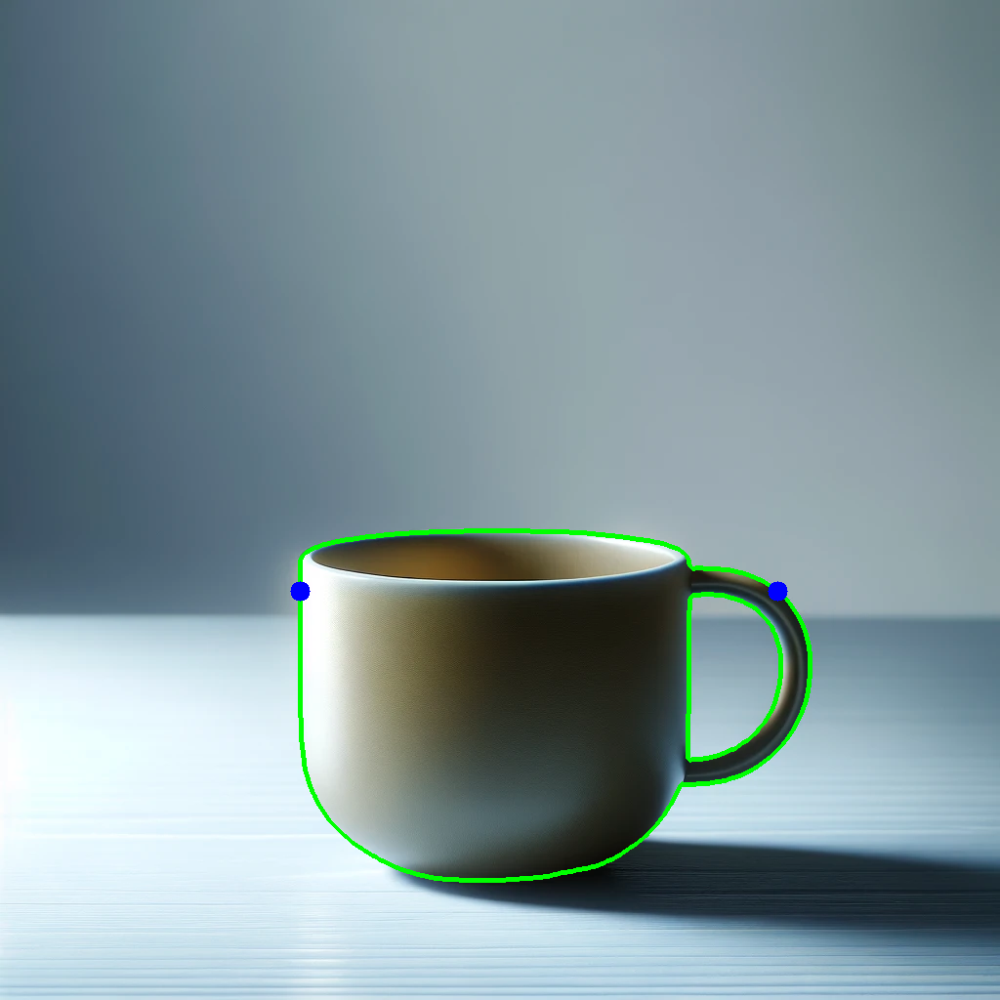

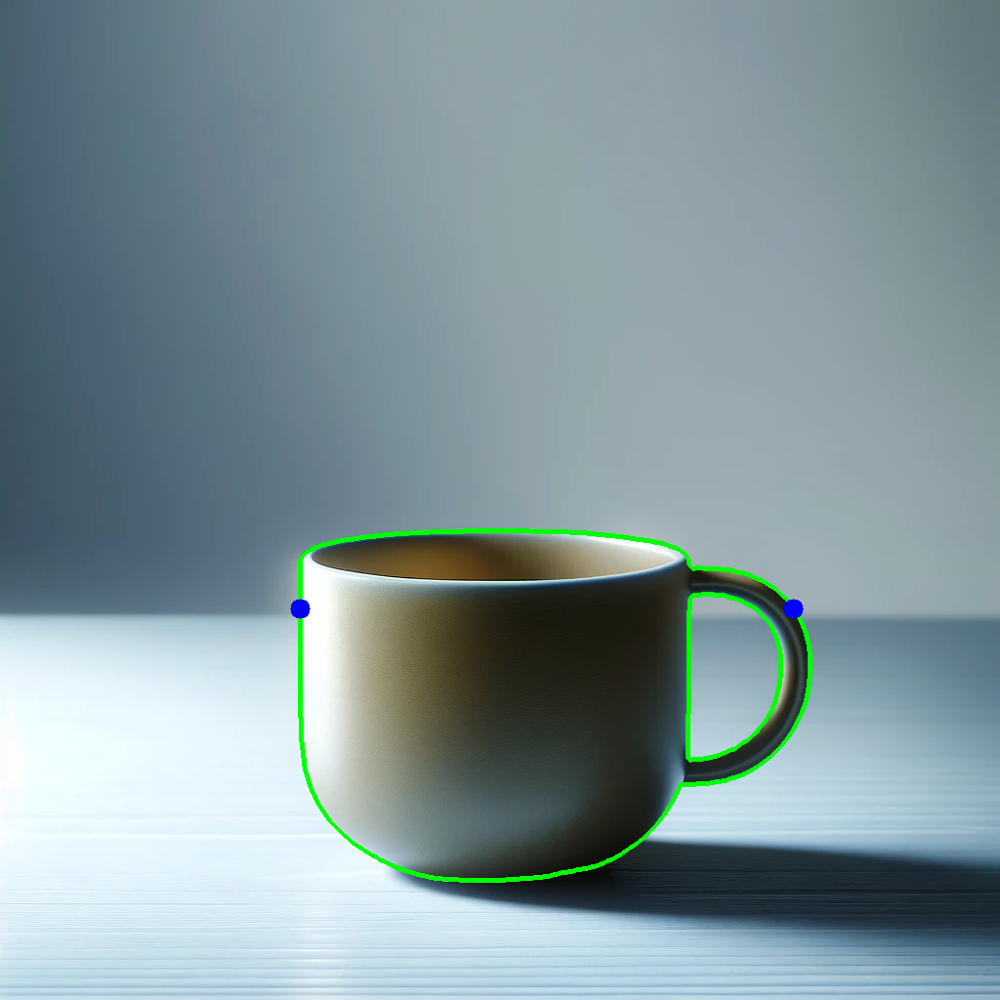

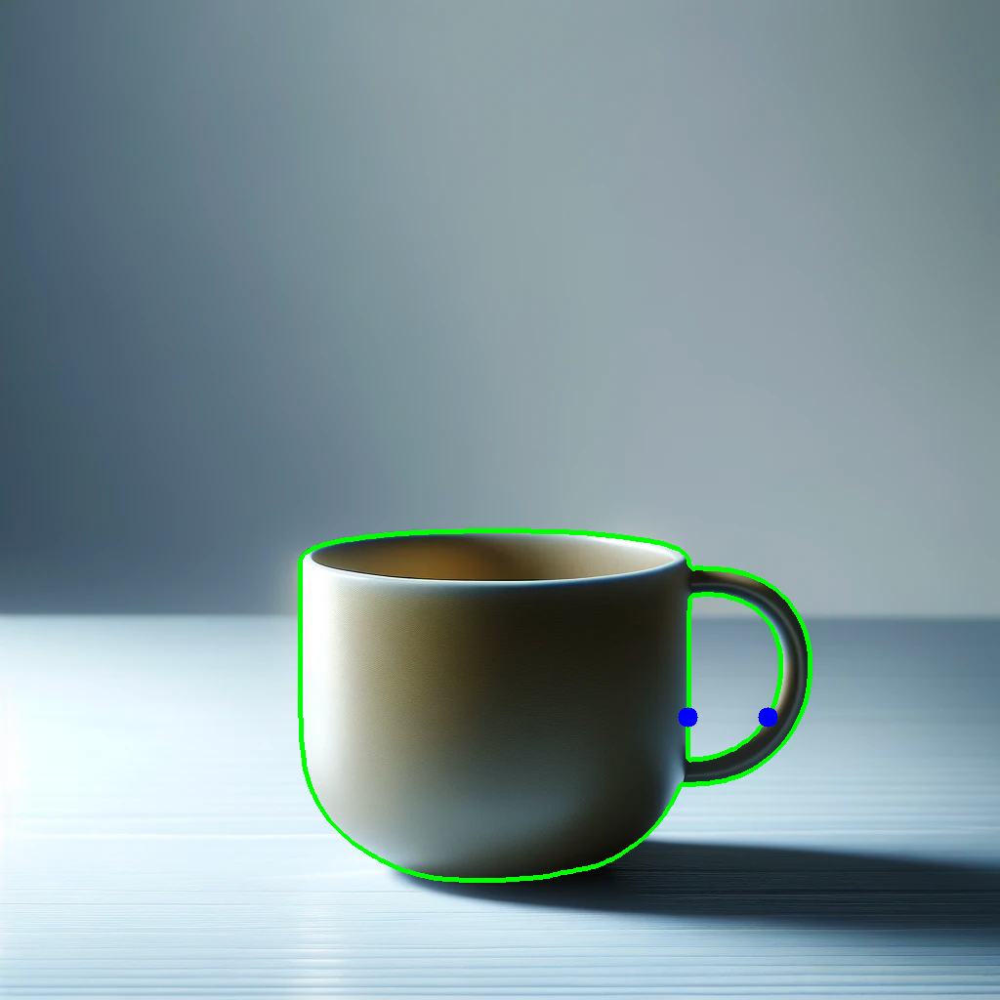

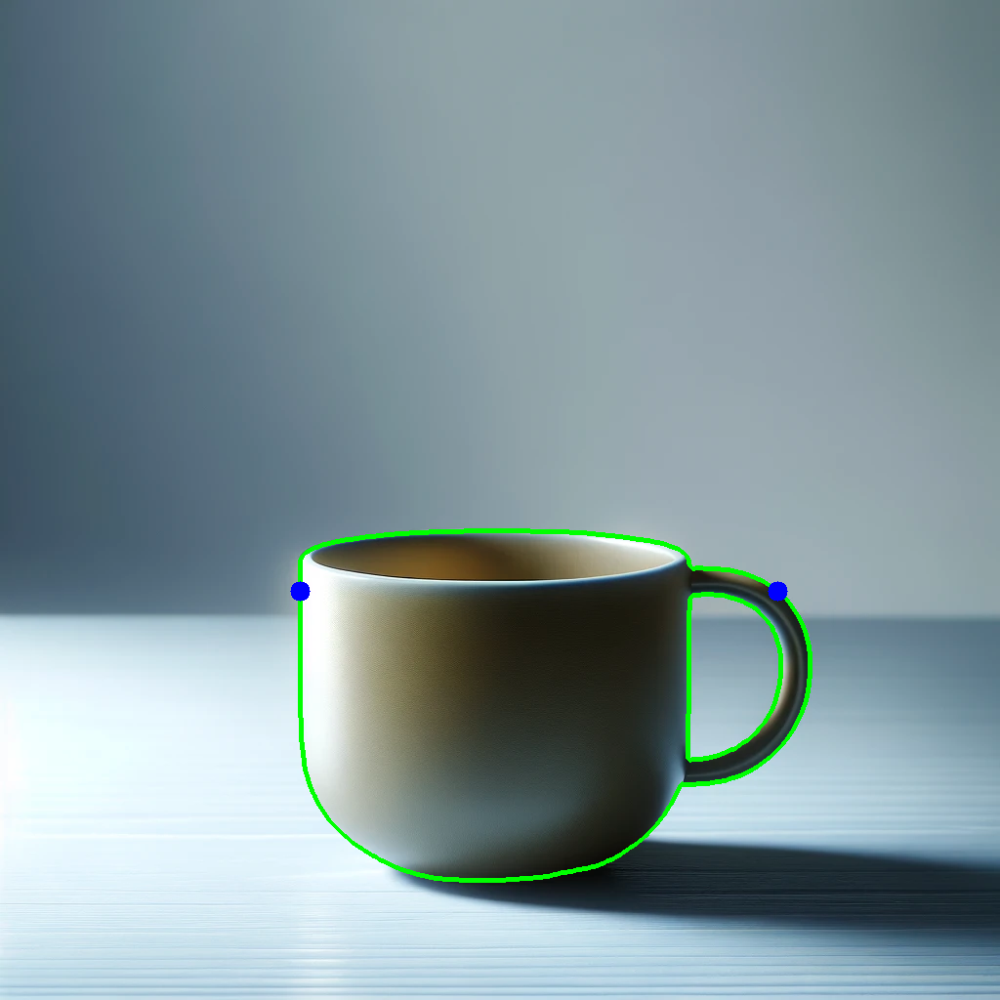

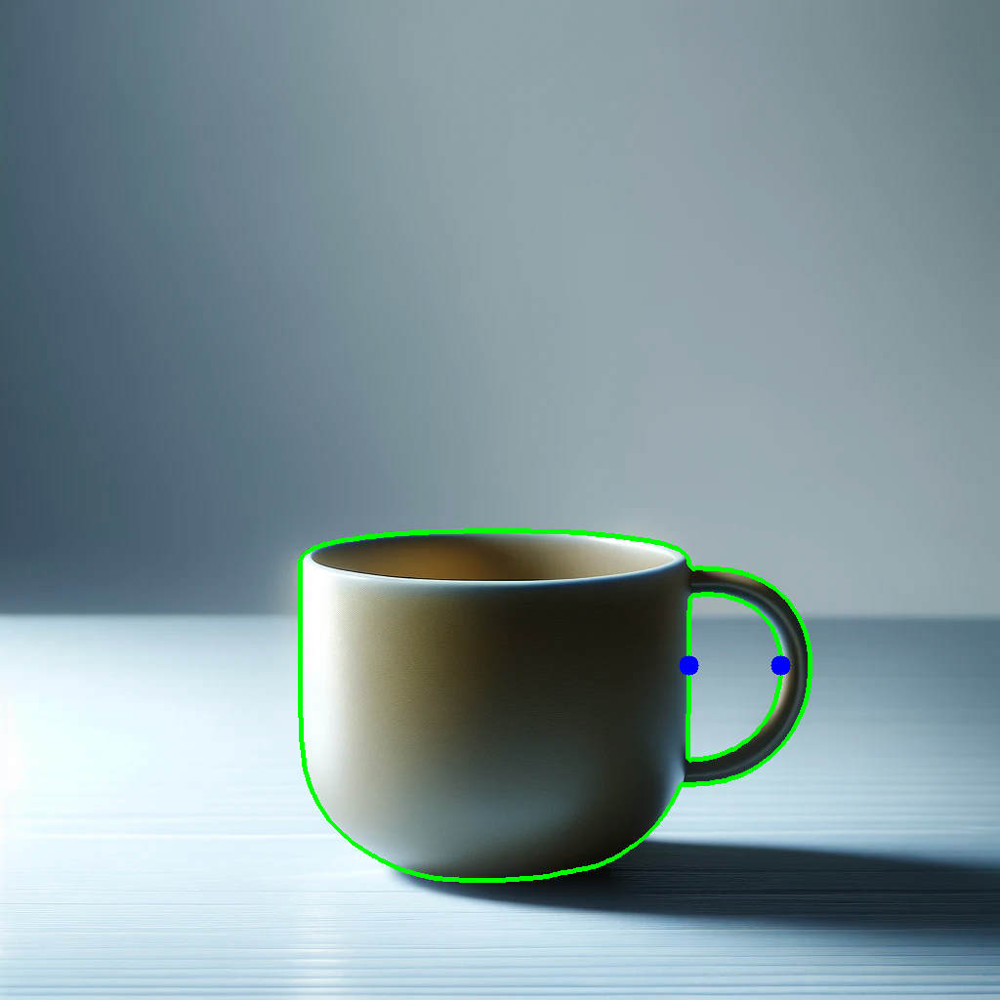

...

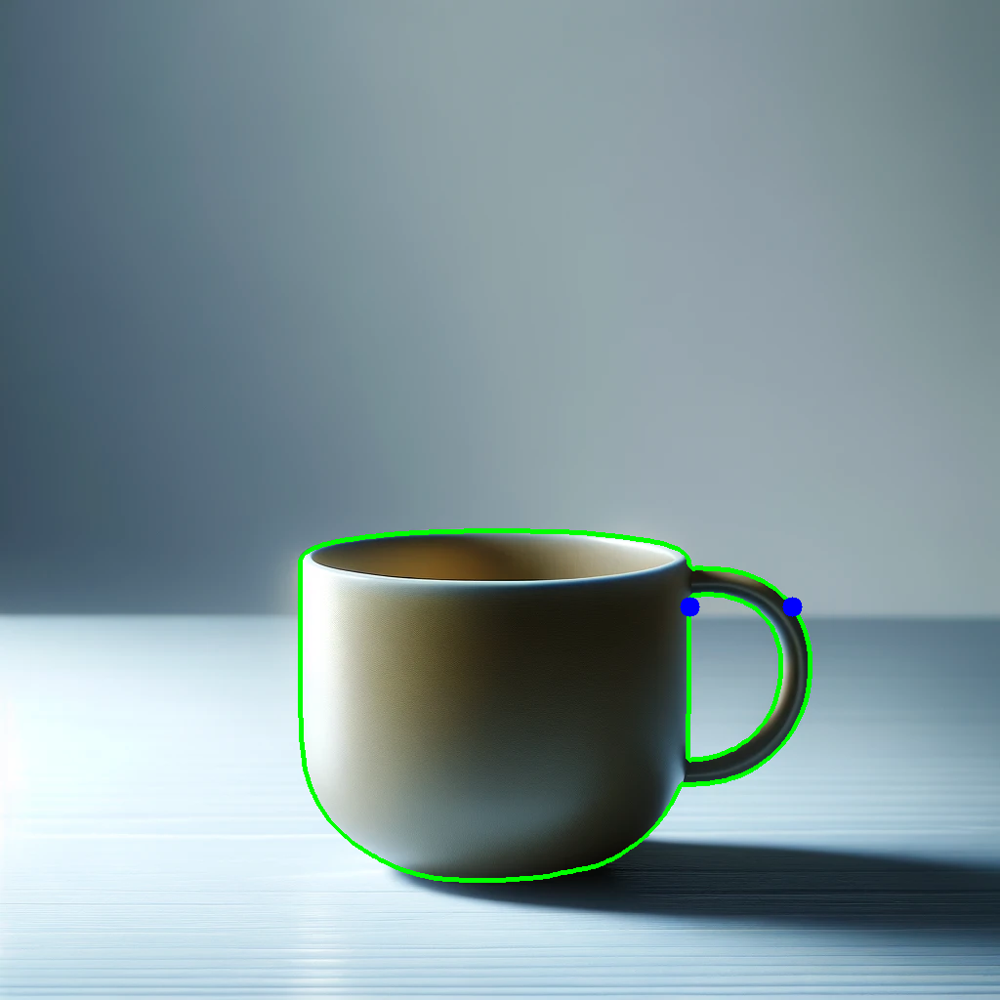

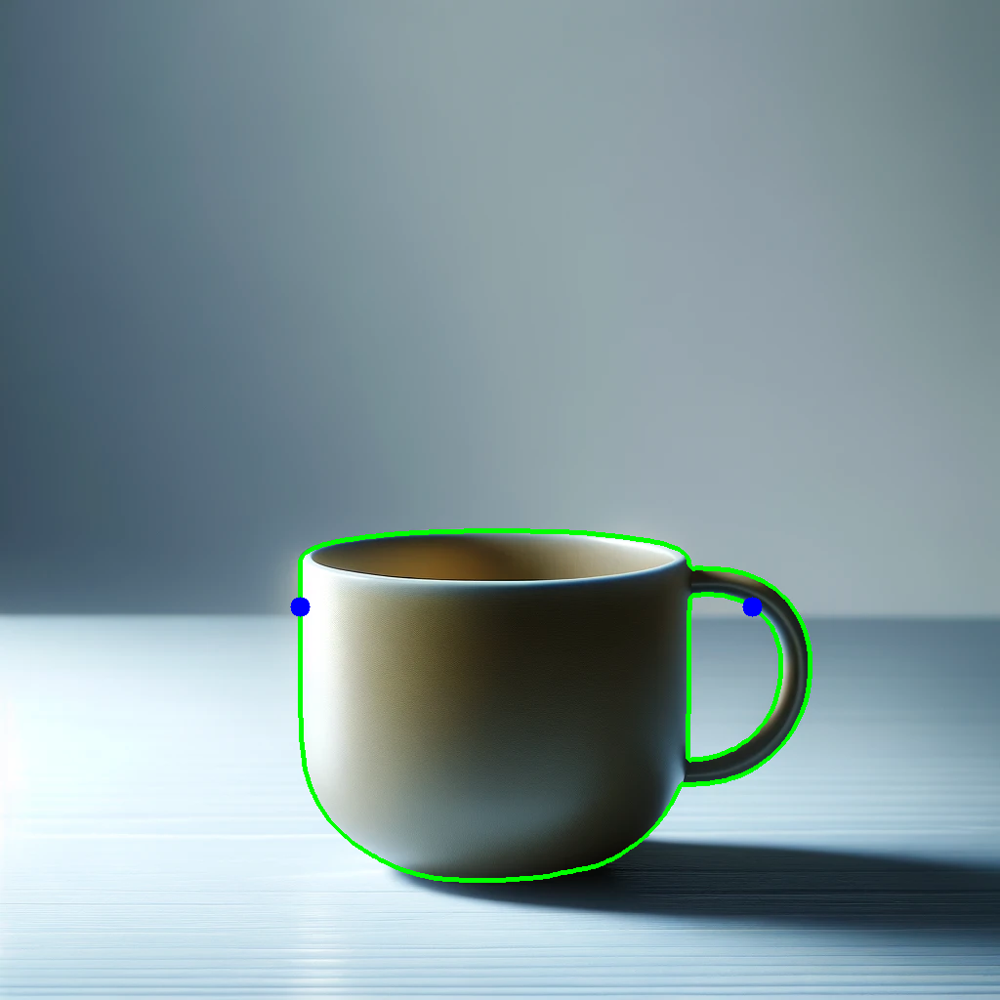

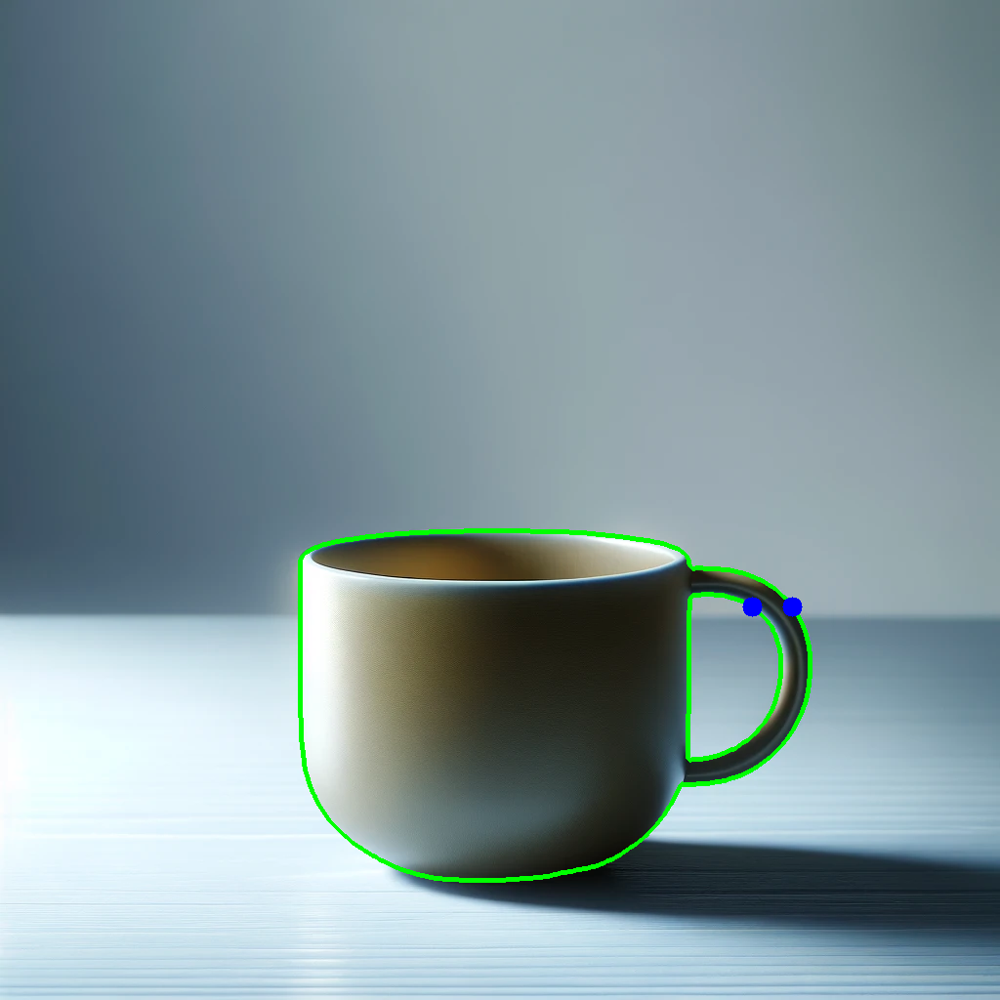

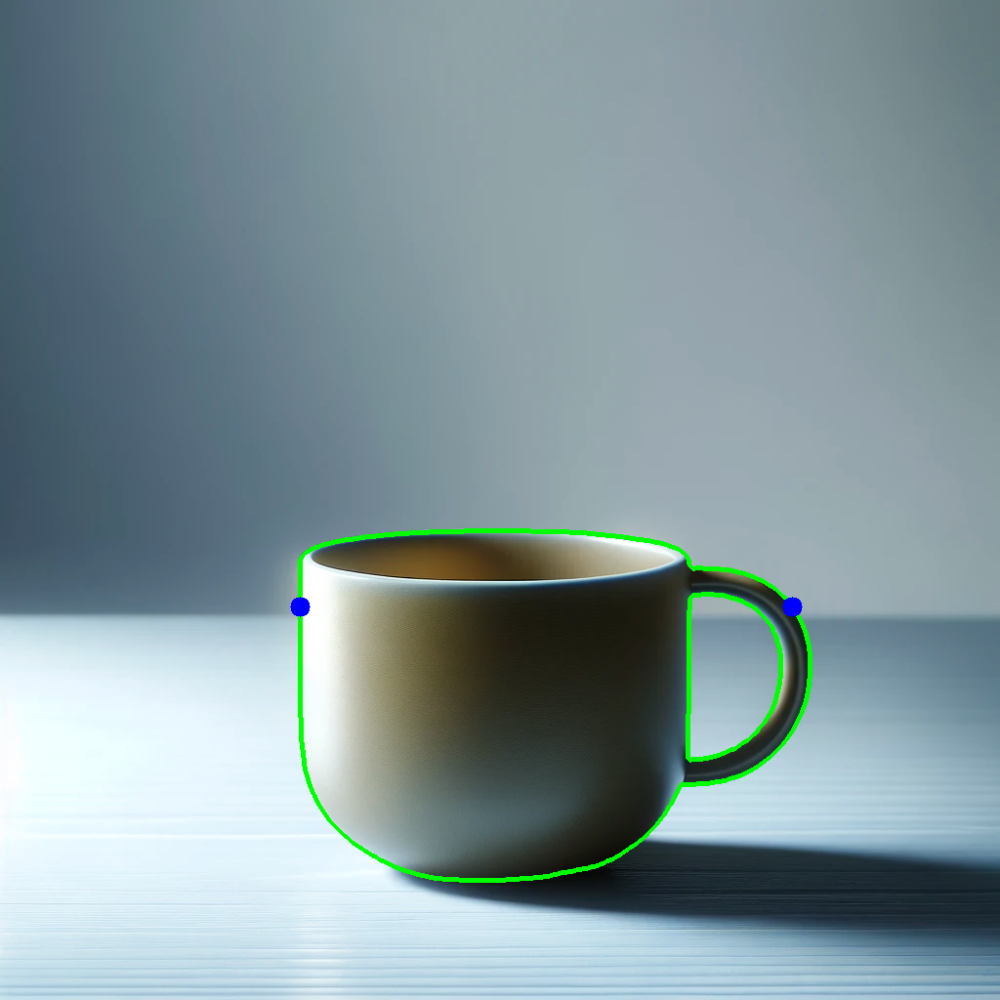

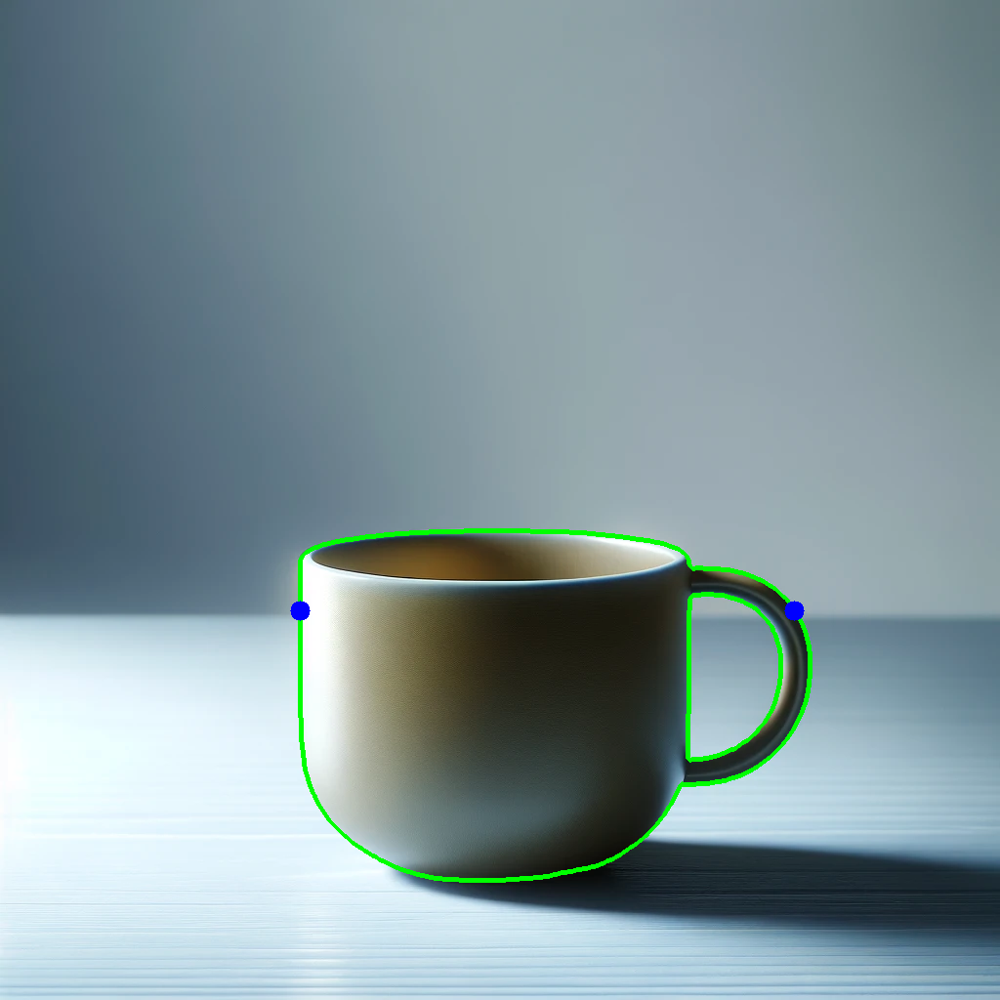

In [14]:
for i in range(20):
  image_bgr = cv2.imread(IMAGE_PATH)
  image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
  calculate_angle_and_coordinates(detections,image_rgb,bbox)